# OpenRAM Playground
Authored by Farhad Modaresi

# 1. Install OpenRAM and its dependancies


In [ ]:
# Clone OpenRAM version 1.2.8:
! cd $HOME && git clone -b v1.2.8 https://github.com/VLSIDA/OpenRAM

# Run the install_conda.sh script which installs the following tools using anaconda:
# Miniconda, litex-hub, iverilog, VLSIDA-EDA (klayout, magic, netgen, ngspice, trilinos, xyce)
! cd $HOME/OpenRAM && ./install_conda.sh

# Set environment variables used by the OpenRAM compiler and related tools to 
# locate and use various files and libraries needed for the design and 
# simulation of SRAM cells:
%env OPENRAM_HOME="/root/OpenRAM/compiler"
%env OPENRAM_TECH="/root/OpenRAM/technology"
%env PYTHONPATH=$OPENRAM_HOME
%env PYTHONPATH="$OPENRAM_HOME:$OPENRAM_TECH/sky130:$OPENRAM_TECH/sky130/custom"

# Download and set up SKY130 PDK (spice, GDS, magic, etc. libraries)
! source /root/OpenRAM/miniconda/bin/activate && cd $HOME/OpenRAM && make pdk

# Download and set up the SKY130 SRAM build space which has the necessary 
# components for OpenRAM to compile SRAM macros
! cd $HOME/OpenRAM && make install

Streaming output truncated to the last 5000 lines.
Writing 'sky130_fd_sc_hd__mux2i_4'
Writing 'sky130_fd_sc_hd__a21boi_2'
Writing 'sky130_fd_sc_hd__clkinv_8'
Writing 'sky130_fd_sc_hd__a21o_2'
Writing 'sky130_fd_sc_hd__a211oi_1'
Writing 'sky130_fd_sc_hd__o311a_1'
Writing 'sky130_fd_sc_hd__a32o_1'
Writing 'sky130_fd_sc_hd__clkdlybuf4s15_1'
Writing 'sky130_fd_sc_hd__sedfxtp_2'
Writing 'sky130_fd_sc_hd__o221a_1'
Writing 'sky130_fd_sc_hd__mux4_4'
Writing 'sky130_fd_sc_hd__and4_2'
Writing 'sky130_fd_sc_hd__mux2_1'
Writing 'sky130_fd_sc_hd__nand4_4'
Writing 'sky130_fd_sc_hd__o2bb2a_2'
Writing 'sky130_fd_sc_hd__dfstp_2'
Writing 'sky130_fd_sc_hd__nand2_1'
Writing 'sky130_fd_sc_hd__sdfrtp_1'
Writing 'sky130_fd_sc_hd__o311a_2'
Writing 'sky130_fd_sc_hd__o31ai_4'
Writing 'sky130_fd_sc_hd__a32o_2'
Writing 'sky130_fd_sc_hd__a211oi_2'
Writing 'sky130_fd_sc_hd__clkdlybuf4s15_2'
Writing 'sky130_fd_sc_hd__clkbuf_1'
Writing 'sky130_fd_sc_hd__lpflow_inputiso0n_1'
Writing 'sky130_fd_sc_hd__o221a_2'
Writing 

# 4. Install GDS viewers

In [ ]:
# 2D View:
# Install Gdstk (GDSII Tool Kit) to convert gds to svg:
! pip install gdstk
# Install Imagemagick and its dependencies to convert svg into png
! apt update && apt install imagemagick fonts-freefont-otf ghostscript fonts-freefont-ttf inkscape

# 3D View:
# Install Python3 GDS to glTF files converter script made by Maximo
!cd $HOME && git clone https://github.com/mbalestrini/GDS2glTF.git
!cd $HOME && python -m pip install -r GDS2glTF/requirements.txt

# Install glTF HTML viewer made by Johan Euphrosine (Proppy)
!git clone https://github.com/proppy/gds_viewer.git
import jinja2
gds_viewer = jinja2.Environment(loader=jinja2.FileSystemLoader('gds_viewer')).get_template('viewer.html') 

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following additional packages will be installed:
  aspell aspell-en fig2dev fonts-droid-fallback fonts-noto-mono
  fonts-urw-base35 gawk gsfonts imagemagick-6-common imagemagick-6.q16
  libatkmm-1.6-1v5 libcairomm-1.0-1v5 libcdr-0.1-1 libdbus-glib-1-2
  libdjvulibre-text libdjvulibre21 libgail-common libgail18 libglibmm-2.4-1v5
  libgs9 libgs9-common libgsl23 libgslcblas0 libgtk2.0-0 libgtk2.0-bin
  libgtk2.0-common libgtkmm-2.4-1v5 libgtkspell0 libidn11 libijs-0.35
  libimage-magick-perl libimage-magick-q16-perl libjbig2dec0 liblqr-1-0
  libmagick++-6.q16-8 libmagickcore-6.q16-6 libmagickcore-6.q16-6-extra
  libmagickwand-6.q16-6 libnetpbm10 libpangomm-1.4-1v5 libpoppler-glib8
  libpotrace0 libpython2-stdlib librevenge-0.0-0 libsigc++-2.0-0v5
  libvisio-0.1-1 libwmf-bin libwmf0.2-7 libwpd-

# SRAM Cells:
Left: Single port
Right: Dual port

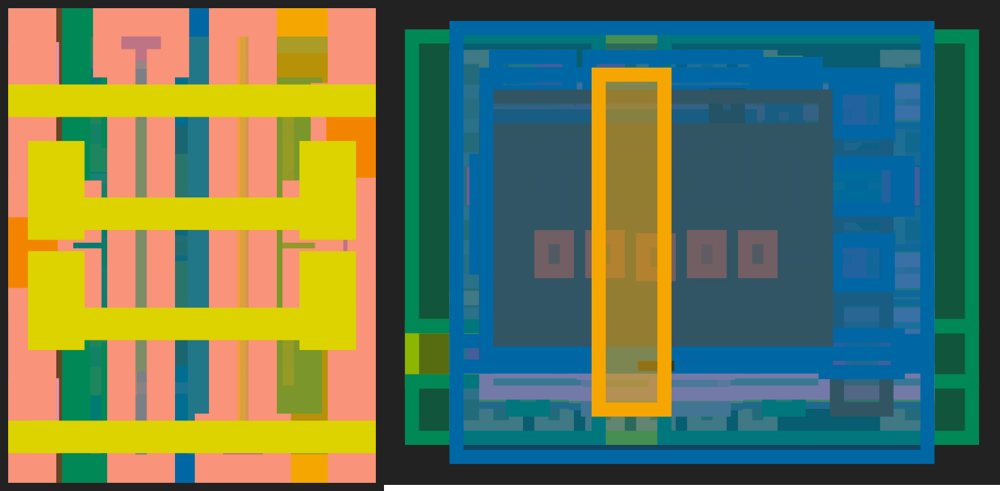

In [29]:
#@title
sp = "/root/OpenRAM/technology/sky130/gds_lib/sky130_fd_bd_sram__sram_sp_cell_opt1.gds"
import gdstk
from IPython.display import Image
library = gdstk.read_gds(sp)
top_cells = library.top_level()
top_cells[0].write_svg(f'sp.svg')
! convert -density 4000 sp.svg sp.png 
dp = "/root/OpenRAM/technology/sky130/gds_lib/sky130_fd_bd_sram__openram_dp_cell.gds"
library = gdstk.read_gds(dp)
top_cells = library.top_level()
top_cells[0].write_svg(f'dp.svg')
! convert -density 2000 dp.svg dp.png 
! convert +append sp.png dp.png merged.png
Image("merged.png", width=1000)

# 2. Macro specifications:
Defines the SRAM macro specifications.

In [ ]:
#@title
config_file = "/root/OpenRAM/macros/sram_configs/sky130_sram_1rw1r_tiny.py"
#@markdown ---
#@markdown ### Number of bits for each memory word:
word_size = 8 #@param {type:"raw"}
#@markdown ---
#@markdown ### Total number of memory words:
num_words = 16 #@param {type:"raw"}
#@markdown ---
#@markdown ### Lowest number of writable bits in one write cylce:
write_size = 2 #@param {type:"raw"}
#@markdown ---
#@markdown ### Number of Read/Write ports:
num_rw_ports = 1 #@param {type:"raw"}
#@markdown ---
#@markdown ### Number of Read only ports:
num_r_ports = 1 #@param {type:"raw"}
#@markdown ---
#@markdown ### Number of Write only ports:
num_w_ports = 0 #@param {type:"raw"}
#@markdown ---



! sed -i "s/^word_size.*$/word_size = $word_size/" $config_file 
! sed -i "s/^num_words.*$/num_words = $num_words/" $config_file 
! sed -i "s/^write_size.*$/write_size = $write_size/" $config_file 
! sed -i "s/^num_rw_ports.*$/num_rw_ports = $num_rw_ports/" $config_file 
! sed -i "s/^num_r_ports.*$/num_r_ports = $num_r_ports/" $config_file 
! sed -i "s/^num_w_ports.*$/num_w_ports = $num_w_ports/" $config_file 
! sed -i "s/^FIXME.*$//" $config_file 


! cat /root/OpenRAM/macros/sram_configs/sky130_sram_1rw1r_tiny.py

"""
Dual port (1 read/write + 1 read only) 1 kbytes SRAM with byte write.



"""
word_size = 8
num_words = 16
human_byte_size = "{:.0f}kbytes".format((word_size * num_words)/1024/8)

# Allow byte writes
write_size = 2

# Dual port
num_rw_ports = 1
num_r_ports = 1
num_w_ports = 0
ports_human = '1rw1r'

import os
exec(open(os.path.join(os.path.dirname(__file__), 'sky130_sram_common.py')).read())


# 3. Compile the SRAM macro for SKY130 using the above specs:


In [ ]:
! cd /root/OpenRAM/macros/ && make sky130_sram_1rw1r_tiny.ok

Building sky130_sram_1rw1r_tiny
[openram.globals/init_openram]: Initializing OpenRAM...
[openram.globals/setup_paths]: OpenRAM source code found in /root/OpenRAM/compiler
[openram.globals/setup_paths]: Temporary files saved in /results/sky130_sram_1rw1r_tiny/tmp/
[openram.globals/read_config]: Configuration file is /root/OpenRAM/macros/sram_configs/sky130_sram_1rw1r_tiny.py
[openram.globals/read_config]: Output saved in /root/OpenRAM/macros/sky130_sram_1rw1r_tiny/
[openram.globals/install_conda]: Creating conda setup...
[openram.globals/import_tech]: Tech directory found in /root/OpenRAM/technology:/root/OpenRAM/compiler/../technology
[openram.globals/import_tech]: Adding technology path: /root/OpenRAM/technology
[openram.globals/import_tech]: Adding technology path: /root/OpenRAM/compiler/../technology
[openram.globals/init_paths]: Creating temp directory: /results/sky130_sram_1rw1r_tiny/tmp/
[openram.globals/setup_bitcell]: Using bitcell: bitcell_2port
[openram.characterizer/<module>

# 5. 2D GDS view:

convert-im6.q16: unrecognized option `-dpi' @ error/convert.c/ConvertImageCommand/1410.


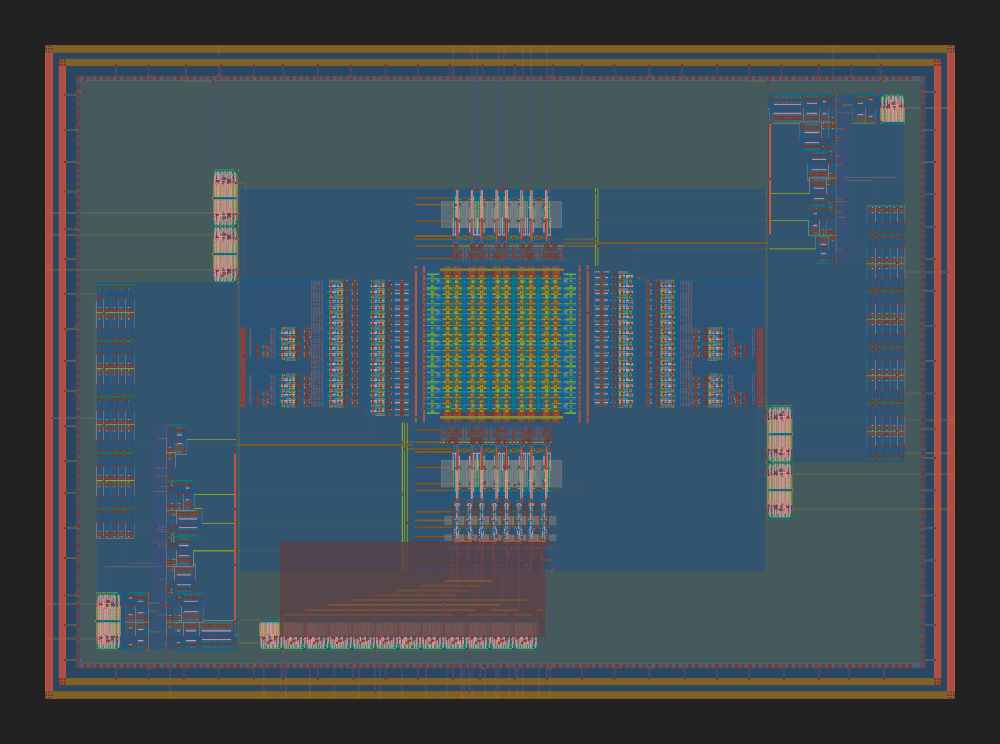

In [35]:
#@title
import gdstk
# from IPython.display import SVG
from IPython.display import Image

gds = "/root/OpenRAM/macros/sky130_sram_1rw1r_tiny/sky130_sram_1rw1r_tiny.gds"
library = gdstk.read_gds(gds)
top_cells = library.top_level()
top_cells[0].write_svg(f'spm.svg')
! convert -dpi 100 spm.svg spm.png 
# ! inkscape -z -f spm.svg -w 1000 -j -e spm.png 

Image("spm.png", width=1500)
# SVG(f'spm.svg')

# 6. 3D GDS View

In [ ]:
#@title
import pathlib

gds = "/root/OpenRAM/macros/sky130_sram_1rw1r_tiny/sky130_sram_1rw1r_tiny.gds"
!cd $HOME && python3 GDS2glTF/gds2gltf.py /root/OpenRAM/macros/sky130_sram_1rw1r_tiny/sky130_sram_1rw1r_tiny.gds | tee gds2gltf.log
import IPython.display
IPython.display.clear_output(wait=True)
with open(f'{gds}.gltf') as f:
  gltf_data=f.read()
  output = gds_viewer.render(gltf_data=gltf_data)
IPython.display.HTML(output)